**DeepMel – Music Generation using Deep Learning**

Importing Libraries

In [1]:
import tensorflow
import numpy as np
import pandas as pd 
from collections import Counter
import random
import IPython
from IPython.display import Image, Audio
import music21
from music21 import *
import matplotlib.pyplot as plt 
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
import tensorflow.keras.backend as K
from tensorflow.keras.optimizers import Adamax
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
%matplotlib inline
import sys
import os
import warnings
warnings.filterwarnings("ignore")
warnings.simplefilter("ignore")
np.random.seed(42)

Loading and Parsing data

In [2]:
#creating a stream of notes and chords of all midi files
filepath = "/content/drive/MyDrive/chopin/"
all_midis= []
for i in os.listdir(filepath):
    if i.endswith(".mid"):
        tr = filepath+i
        midi = converter.parse(tr)
        all_midis.append(midi)

In [3]:
#extracting above stream in the form of notes to obtain a series
def extract_notes(file):
    notes = []
    pick = None
    for j in file:
        songs = instrument.partitionByInstrument(j)
        for part in songs.parts:
            pick = part.recurse()
            for element in pick:
                if isinstance(element, note.Note):
                    notes.append(str(element.pitch))
                elif isinstance(element, chord.Chord):
                    notes.append(".".join(str(n) for n in element.normalOrder))
    return notes

Data Analysis

In [14]:
def chords_n_notes(Snippet):
    Melody = []
    offset = 0 #Incremental
    for i in Snippet:
        #If it is chord
        if ("." in i or i.isdigit()):
            chord_notes = i.split(".") #Seperating the notes in chord
            notes = [] 
            for j in chord_notes:
                inst_note=int(j)
                note_snip = note.Note(inst_note)            
                notes.append(note_snip)
                chord_snip = chord.Chord(notes)
                chord_snip.offset = offset
                Melody.append(chord_snip)
        # pattern is a note
        else: 
            note_snip = note.Note(i)
            note_snip.offset = offset
            Melody.append(note_snip)
        # increase offset each iteration so that notes do not stack
        offset += 1
    Melody_midi = stream.Stream(Melody)   
    return Melody_midi

Corpus= extract_notes(all_midis)
count_num = Counter(Corpus)
Notes = list(count_num.keys())
Recurrence = list(count_num.values())
def Average(lst):
    return sum(lst) / len(lst)
print("Total unique notes in the Corpus:", len(count_num))
print("Average recurrence for a note in Corpus:", Average(Recurrence))
print("Most frequent note in Corpus appeared:", max(Recurrence), "times")
print("Least frequent note in Corpus appeared:", min(Recurrence), "time")

Total unique notes in the Corpus: 317
Average recurrence for a note in Corpus: 200.09148264984228
Most frequent note in Corpus appeared: 1869 times
Least frequent note in Corpus appeared: 1 time


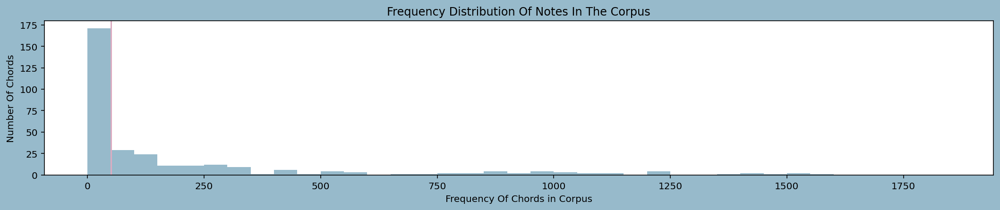

In [5]:
#plotting the distribution of Notes
plt.figure(figsize=(18,3),facecolor="#97BACB")
bins = np.arange(0,(max(Recurrence)), 50) 
plt.hist(Recurrence, bins=bins, color="#97BACB")
plt.axvline(x=50,color="#DBACC1")
plt.title("Frequency Distribution Of Notes In The Corpus")
plt.xlabel("Frequency Of Chords in Corpus")
plt.ylabel("Number Of Chords")
plt.show()

In [6]:
#removing rare notes
rare_note = []
for index, (key, value) in enumerate(count_num.items()):
    if value < 50:
        m =  key
        rare_note.append(m)
for element in Corpus:
    if element in rare_note:
        Corpus.remove(element)

Data Preprocessing

In [7]:
#creating a dictionary to map the notes and their indices
symb = sorted(list(set(Corpus)))
L_corpus = len(Corpus) 
L_symb = len(symb)
mapping = dict((c, i) for i, c in enumerate(symb))
reverse_mapping = dict((i, c) for i, c in enumerate(symb))

In [8]:
#splitting the Corpus in equal length of strings
length = 40
features = []
targets = []
for i in range(0, L_corpus - length, 1):
    feature = Corpus[i:i + length]
    target = Corpus[i + length]
    features.append([mapping[j] for j in feature])
    targets.append(mapping[target])
L_datapoints = len(targets)

# reshape X and normalize
X = (np.reshape(features, (L_datapoints, length, 1)))/ float(L_symb)
# one hot encode the output variable
y = tensorflow.keras.utils.to_categorical(targets) 
#split train and seed datasets
X_train, X_seed, y_train, y_seed = train_test_split(X, y, test_size=0.2, random_state=42)

Building model

In [9]:
model = Sequential()
model.add(LSTM(512, input_shape=(X.shape[1], X.shape[2]), return_sequences=True))
model.add(Dropout(0.1))
model.add(LSTM(256))
model.add(Dense(256))
model.add(Dropout(0.1))
model.add(Dense(y.shape[1], activation='softmax'))
opt = Adamax(learning_rate=0.01)
model.compile(loss='categorical_crossentropy', optimizer=opt)
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 40, 512)           1052672   
                                                                 
 dropout (Dropout)           (None, 40, 512)           0         
                                                                 
 lstm_1 (LSTM)               (None, 256)               787456    
                                                                 
 dense (Dense)               (None, 256)               65792     
                                                                 
 dropout_1 (Dropout)         (None, 256)               0         
                                                                 
 dense_1 (Dense)             (None, 212)               54484     
                                                                 
Total params: 1,960,404
Trainable params: 1,960,404
Non-

In [10]:
#training model
history = model.fit(X_train, y_train, batch_size=256, epochs=200)

Epoch 1/200
193/193 [==============================] - 15s 40ms/step - loss: 4.6432
Epoch 2/200
193/193 [==============================] - 8s 40ms/step - loss: 4.5891
Epoch 3/200
193/193 [==============================] - 8s 40ms/step - loss: 4.5873
Epoch 4/200
193/193 [==============================] - 8s 40ms/step - loss: 4.5837
Epoch 5/200
193/193 [==============================] - 8s 41ms/step - loss: 4.5725
Epoch 6/200
193/193 [==============================] - 8s 41ms/step - loss: 4.5099
Epoch 7/200
193/193 [==============================] - 8s 42ms/step - loss: 4.4242
Epoch 8/200
193/193 [==============================] - 8s 42ms/step - loss: 4.4115
Epoch 9/200
193/193 [==============================] - 8s 43ms/step - loss: 4.4068
Epoch 10/200
193/193 [==============================] - 8s 43ms/step - loss: 4.3891
Epoch 11/200
193/193 [==============================] - 8s 44ms/step - loss: 4.3824
Epoch 12/200
193/193 [==============================] - 9s 44ms/step - loss: 4.3728


Evaluating model

[Text(0.5, 0, 'Epochs')]

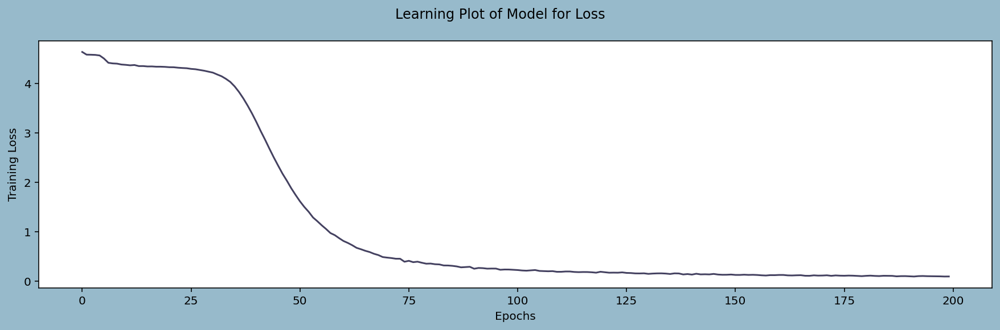

In [11]:
history_df = pd.DataFrame(history.history)
fig = plt.figure(figsize=(15,4), facecolor="#97BACB")
fig.suptitle("Learning Plot of Model for Loss")
pl=sns.lineplot(data=history_df["loss"],color="#444160")
pl.set(ylabel ="Training Loss")
pl.set(xlabel ="Epochs")

Generate Melody

In [21]:
def Melody_Generator(Note_Count):
    seed = X_seed[np.random.randint(0,len(X_seed)-1)]
    Music = ""
    Notes_Generated=[]
    for i in range(Note_Count):
        seed = seed.reshape(1,length,1)
        prediction = model.predict(seed, verbose=0)[0]
        prediction = np.log(prediction) / 1.0 #diversity
        exp_preds = np.exp(prediction)
        prediction = exp_preds / np.sum(exp_preds)
        index = np.argmax(prediction)
        index_N = index/ float(L_symb)   
        Notes_Generated.append(index)
        Music = [reverse_mapping[char] for char in Notes_Generated]
        seed = np.insert(seed[0],len(seed[0]),index_N)
        seed = seed[1:]
    Melody = chords_n_notes(Music)
    Melody_midi = stream.Stream(Melody)   
    return Music,Melody_midi


#getting the Notes and Melody created by the model
Music_notes, Melody = Melody_Generator(100)
Melody.write('midi','Melody_Generated.mid')
IPython.display.Audio("/content/drive/MyDrive/Melody Generated.wav")    